# Imports and configurations

In [ ]:
!pip install mne

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 34.2 MB/s eta 0:00:00


In [ ]:
# pip install braindecode

In [ ]:
!pip install pymatreader

In [ ]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import scipy.io
import os
import re
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (10, 6)
mpl.rcParams['axes.grid'] = True
mpl.rcParams['legend.fontsize'] = 'large'

In [ ]:
from scipy import signal

In [ ]:
import mne
mne.set_config('MNE_BROWSE_RAW_SIZE','16,8')



Attempting to create new mne-python configuration file:
/root/.mne/mne-python.json


# EDA

## Data loading and experimenting

In [ ]:
subject = scipy.io.loadmat('/content/drive/MyDrive/eeg_data/HaLT-SubjectM-161124-6St-LRHandLegTongue.mat')

In [ ]:
subject['o'][0].dtype

dtype([('id', 'O'), ('tag', 'O'), ('sampFreq', 'O'), ('nS', 'O'), ('marker', 'O'), ('data', 'O'), ('chnames', 'O'), ('binsuV', 'O')])

In [ ]:
channels = [ch[0] for ch in subject['o'][0][0][6][:,0]]

2: sampFreq

3: nS

4: marker

5: data

In [ ]:
subject['o'][0][0][4]

array([[0],
       [0],
       [0],
       ...,
       [0],
       [0],
       [0]], dtype=uint8)

In [ ]:
int_marker = [1,2,3,4,5,6]
marker_array = subject['o'][0][0][4].reshape(1,-1)[0]
events = []
for i,m in enumerate(marker_array):
  if m in int_marker and marker_array[i-1]==0:
    events.append([i,0,m])

In [ ]:
events = np.array(events)

In [ ]:
events.shape

(954, 3)

In [ ]:
# samp Frequency
sfreq = subject['o'][0][0][2][0]

In [ ]:
#mat = np.delete(subject['o'][0][0][5],21,axis=1)
mat = subject['o'][0][0][5]

In [ ]:
mat.shape

(678600, 22)

In [ ]:
#info = mne.create_info(ch_names = channels,ch_types='eeg',sfreq = 200)
info = mne.create_info(ch_names = channels,ch_types=['eeg']*21 + ['stim'],sfreq = sfreq)

In [ ]:
info

Measurement date,Unknown
Experimenter,Unknown
Participant,Unknown
Digitized points,Not available
Good channels,"21 EEG, 1 Stimulus"
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,200.00 Hz
Highpass,0.00 Hz
Lowpass,100.00 Hz


In [ ]:
raw = mne.io.RawArray(mat.T, info)

Creating RawArray with float64 data, n_channels=22, n_times=678600
    Range : 0 ... 678599 =      0.000 ...  3392.995 secs
Ready.


In [ ]:
raw.add_events(events,replace=True)

In [ ]:
raw[:]

(array([[ -0.  ,  -0.  ,  -0.  , ..., -39.13, -40.07, -40.02],
        [ -0.  ,  -0.  ,  -0.  , ...,  -8.82,  -5.54,  -9.47],
        [ -0.  ,  -0.  ,  -0.  , ...,   1.33,   0.97,   2.63],
        ...,
        [ -0.  ,  -0.  ,  -0.  , ...,   5.62,   5.65,   4.4 ],
        [ -0.  ,  -0.  ,  -0.  , ...,   0.38,   2.26,   1.47],
        [  0.  ,   0.  ,   0.  , ...,   0.  ,   0.  ,   0.  ]]),
 array([0.000000e+00, 5.000000e-03, 1.000000e-02, ..., 3.392985e+03,
        3.392990e+03, 3.392995e+03]))

In [ ]:
raw.times

array([0.000000e+00, 5.000000e-03, 1.000000e-02, ..., 3.392985e+03,
       3.392990e+03, 3.392995e+03])

In [ ]:
raw['A1']

(array([[ -0.  ,  -0.  ,  -0.  , ..., -20.37, -22.44, -12.37]]),
 array([0.000000e+00, 5.000000e-03, 1.000000e-02, ..., 3.392985e+03,
        3.392990e+03, 3.392995e+03]))

In [ ]:
events

array([[ 35279,      0,      1],
       [ 35966,      0,      4],
       [ 36492,      0,      2],
       ...,
       [662580,      0,      3],
       [663207,      0,      6],
       [663879,      0,      6]])

In [ ]:
event_dict = {
    1: "Left hand",
    2: "Right hand",
    3: "Passive/neutral",
    4: "Left leg",
    5: "Tongue",
    6: "Right leg"
}

In [ ]:
a = (events[:, 0] - 0) / sfreq

In [ ]:
annotations = mne.annotations_from_events(events=events, sfreq=200)#, event_desc=event_dict)

In [ ]:
annotations.set_durations(1)

<Annotations | 954 segments: Left hand (163), Left leg (156), ...>

In [ ]:
raw.set_annotations(annotations)

Measurement date,Unknown
Experimenter,Unknown
Participant,Unknown
Digitized points,Not available
Good channels,"21 EEG, 1 Stimulus"
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,200.00 Hz
Highpass,0.00 Hz
Lowpass,100.00 Hz


In [ ]:
raw.ch_names

['Fp1',
 'Fp2',
 'F3',
 'F4',
 'C3',
 'C4',
 'P3',
 'P4',
 'O1',
 'O2',
 'A1',
 'A2',
 'F7',
 'F8',
 'T3',
 'T4',
 'T5',
 'T6',
 'Fz',
 'Cz',
 'Pz',
 'X5']

## Signal Plots

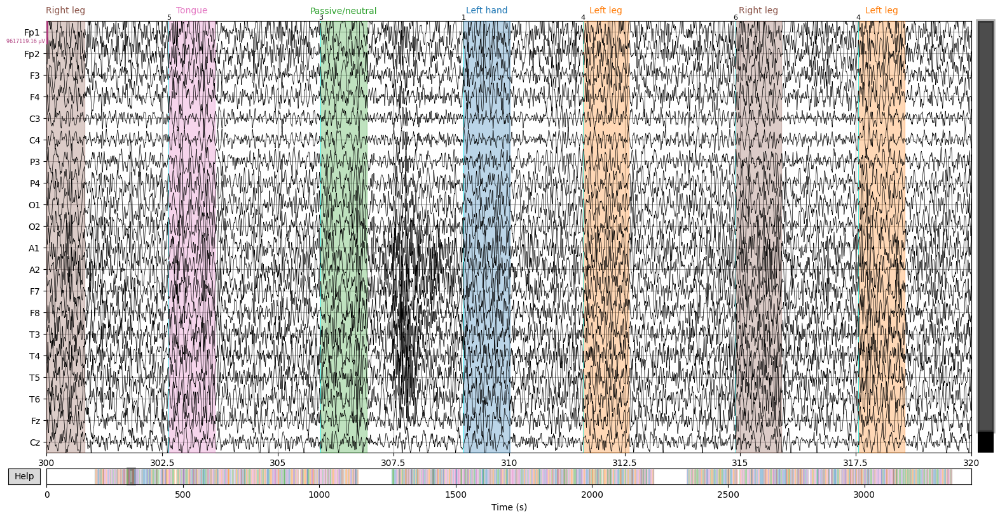

In [ ]:
raw.plot(events = events,picks='data',duration =  20, start = 300, scalings='auto',group_by='type');

In [ ]:
events[:10]

array([[35279,     0,     1],
       [35966,     0,     4],
       [36492,     0,     2],
       [37107,     0,     6],
       [37804,     0,     1],
       [38506,     0,     6],
       [39110,     0,     5],
       [39644,     0,     3],
       [40330,     0,     5],
       [41026,     0,     4]])

In [ ]:
event_op = {k:v for (v,k) in event_dict.items()}

In [ ]:
event_op

{'Left hand': 1,
 'Right hand': 2,
 'Passive/neutral': 3,
 'Left leg': 4,
 'Tongue': 5,
 'Right leg': 6}

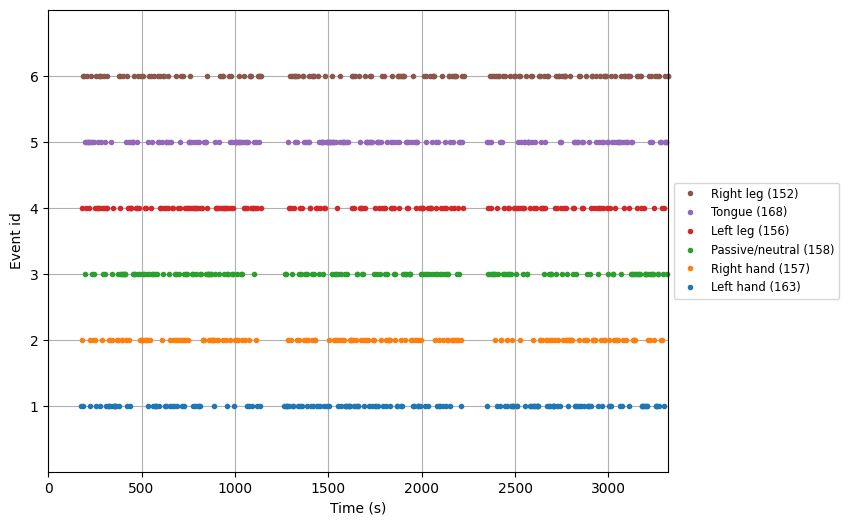

In [ ]:
mne.viz.plot_events(events, sfreq=200,event_id=event_op);

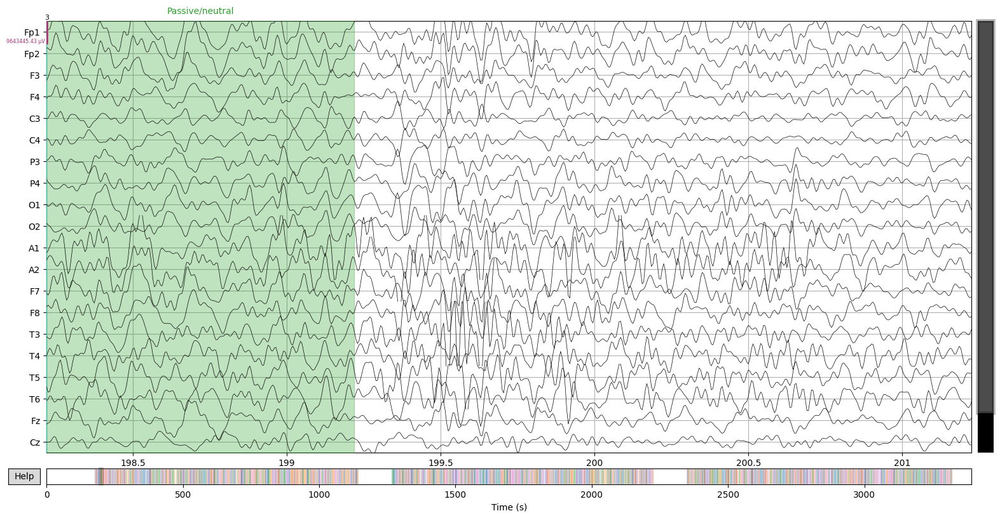

In [ ]:
raw.plot(events = events,duration =  3, start = 39644/200,scalings='auto');

In [ ]:
raw_filtered = raw.copy().filter(l_freq=4, h_freq=40)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 4 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 3.00 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 331 samples (1.655 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.7s


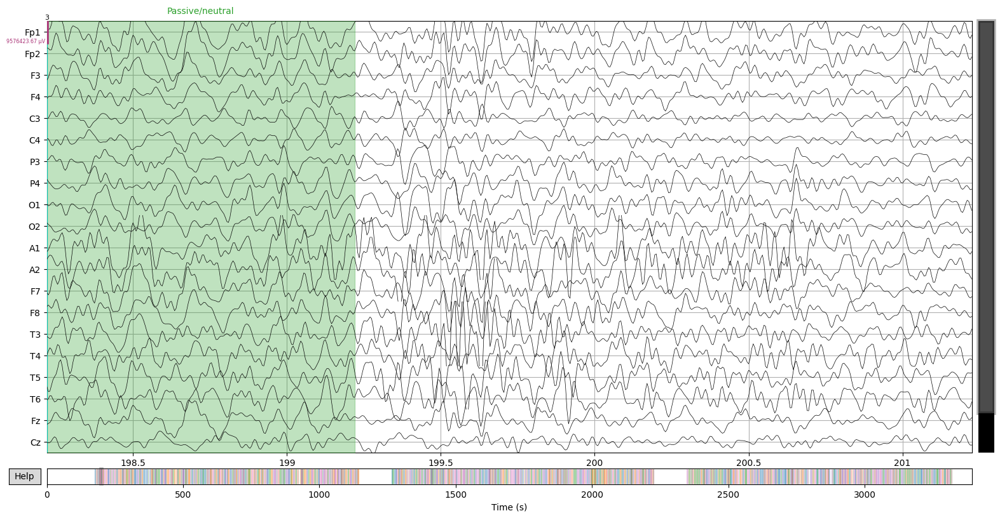

In [ ]:
raw_filtered.plot(events = events,duration =  3, start = 39644/200,scalings='auto');

## Sensors

In [ ]:
s_1020_montage = mne.channels.make_standard_montage("standard_1020")

In [ ]:
raw.set_montage(s_1020_montage)
raw_filtered.set_montage(s_1020_montage)

Measurement date,Unknown
Experimenter,Unknown
Participant,Unknown
Digitized points,24 points
Good channels,"21 EEG, 1 Stimulus"
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,200.00 Hz
Highpass,4.00 Hz
Lowpass,40.00 Hz


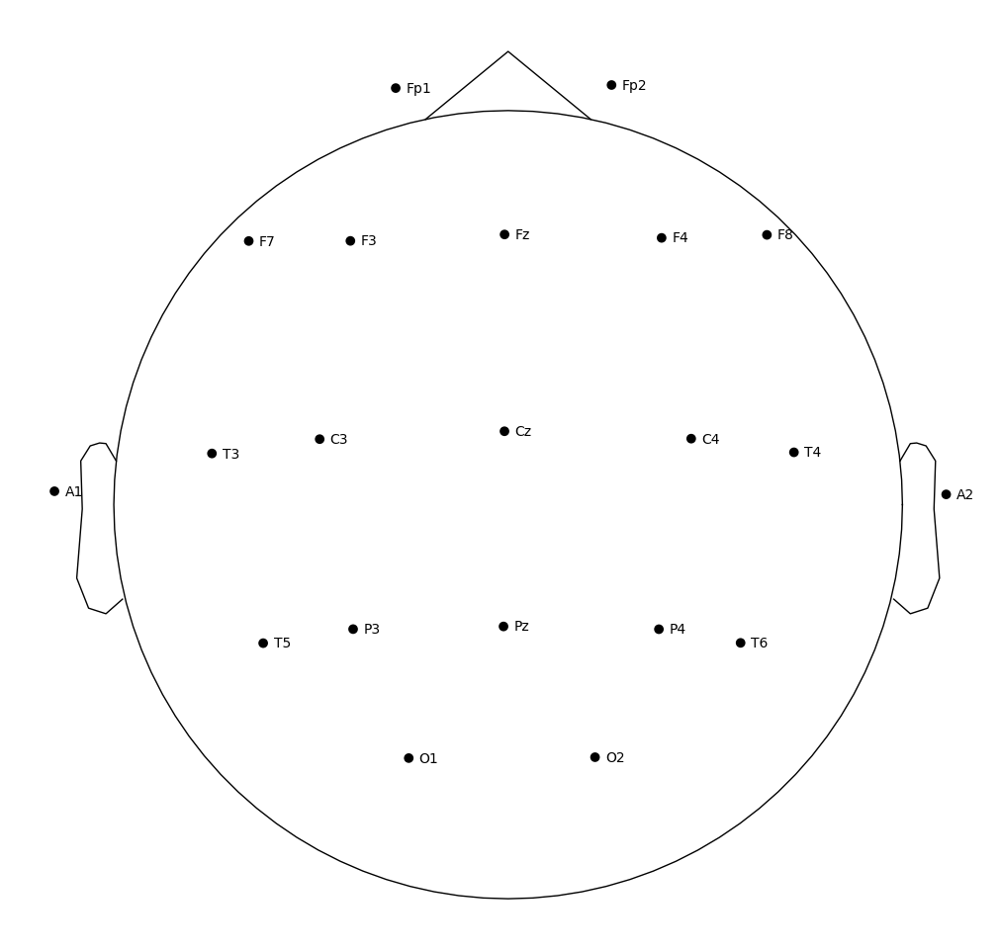

In [ ]:
raw.plot_sensors(ch_type="eeg",show_names=True);

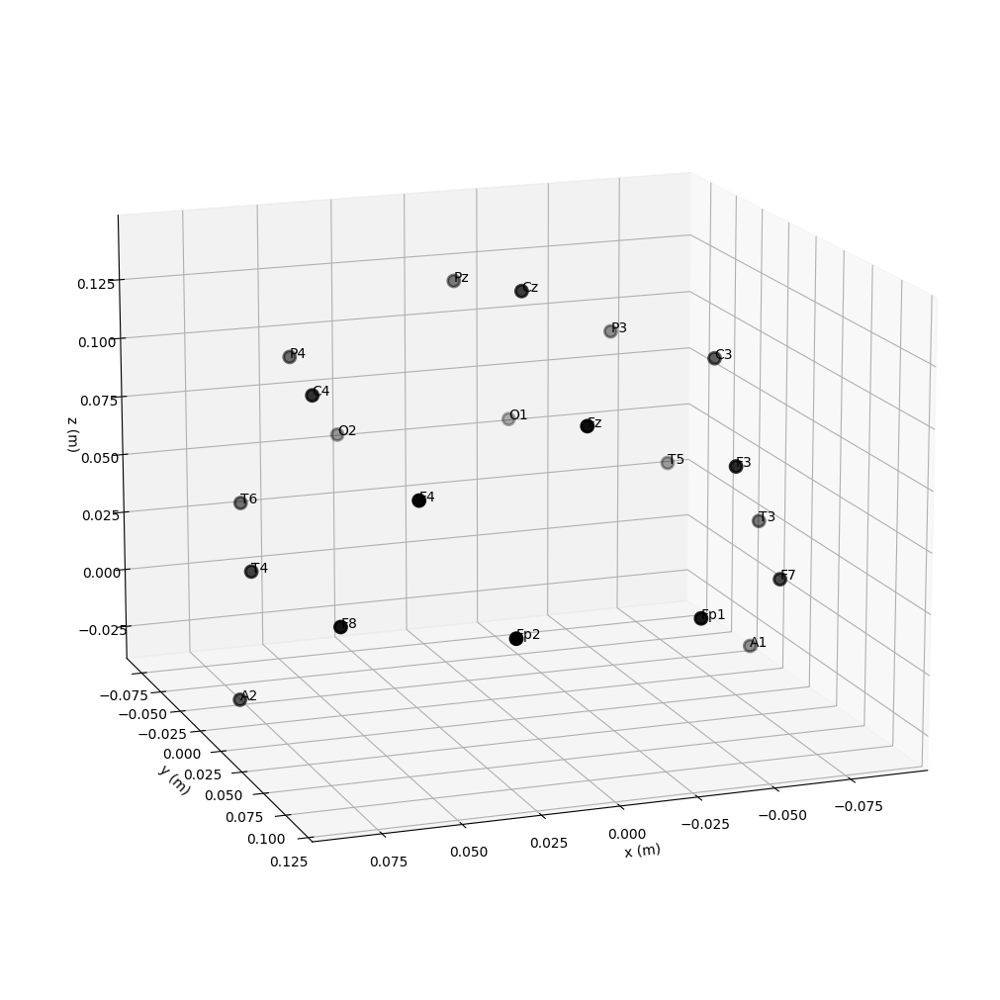

In [ ]:
fig = raw.plot_sensors(ch_type="eeg", kind="3d",show=False,show_names=True)
fig = fig.gca().view_init(azim=70, elev=15);

## Power Spectral Density

Effective window size : 10.240 (s)
Plotting power spectral density (dB=True).


<ipython-input-159-49275512ff1c>:1: FutureWarning: The value of `amplitude='auto'` will be removed in MNE 1.8.0, and the new default will be `amplitude=False`.
  raw.compute_psd(fmax=50, picks='data').plot();


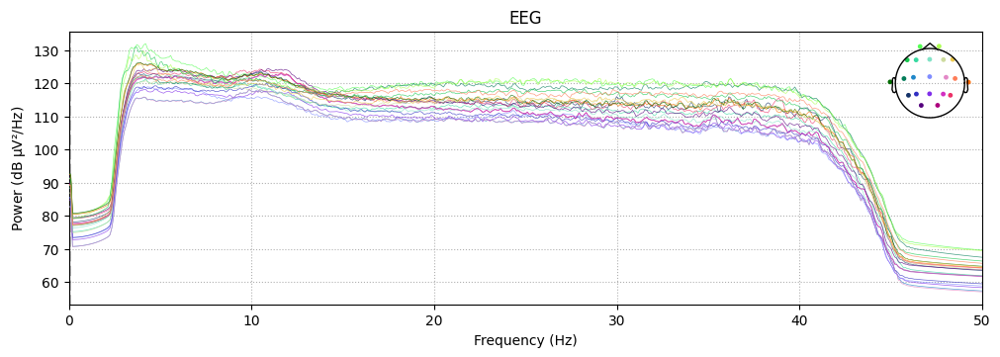

In [ ]:
raw.compute_psd(fmax=50, picks='data').plot();

Effective window size : 10.240 (s)
Plotting power spectral density (dB=True).


<ipython-input-160-6ec93f5c2bae>:1: FutureWarning: The value of `amplitude='auto'` will be removed in MNE 1.8.0, and the new default will be `amplitude=False`.
  raw_filtered.compute_psd(fmax = 50).plot();


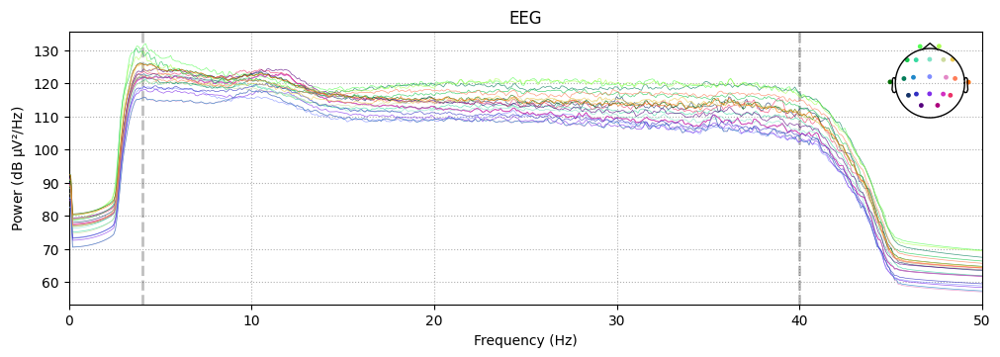

In [ ]:
raw_filtered.compute_psd(fmax = 50).plot();

# Create dataset

In [ ]:
subject = scipy.io.loadmat('/content/drive/MyDrive/eeg_data/HaLT-SubjectM-161124-6St-LRHandLegTongue.mat')

In [ ]:
sfreq = 200
channels = [ch[0] for ch in subject['o'][0][0][6][:,0]]
info = mne.create_info(ch_names = channels,ch_types=['eeg']*21 + ['stim'],sfreq = sfreq)

In [ ]:
raw = mne.io.RawArray(subject['o'][0][0][5].T, info)

Creating RawArray with float64 data, n_channels=22, n_times=678600
    Range : 0 ... 678599 =      0.000 ...  3392.995 secs
Ready.


In [ ]:
subject['o'].dtype.names

('id', 'tag', 'sampFreq', 'nS', 'marker', 'data', 'chnames', 'binsuV')

In [ ]:
# Common info for all subjects and sessions
channel_names = [ch[0] for ch in subject['o'][0][0][6][:,0]]
channel_types = ['eeg']*21 + ['stim']

In [ ]:
iir_params = dict(order=8, ftype="butter",phase='forward')
filt = mne.filter.create_filter(
    raw.get_data(), sfreq, l_freq=None, h_freq=38, method="iir", iir_params=iir_params, verbose=True, phase= 'forward')

Setting up low-pass filter at 38 Hz

IIR filter parameters
---------------------
Butterworth lowpass non-linear phase (one-pass forward) causal filter:
- Filter order 8 (forward)
- Cutoff at 38.00 Hz: -3.01 dB



In [ ]:
filt

{'order': 8,
 'ftype': 'butter',
 'phase': 'forward',
 'padlen': 40,
 'sos': array([[ 1.64043025e-03,  3.28086050e-03,  1.64043025e-03,
          1.00000000e+00, -3.85085430e-01,  4.60737473e-02],
        [ 1.00000000e+00,  2.00000000e+00,  1.00000000e+00,
          1.00000000e+00, -4.15237177e-01,  1.27980120e-01],
        [ 1.00000000e+00,  2.00000000e+00,  1.00000000e+00,
          1.00000000e+00, -4.85474350e-01,  3.18777425e-01],
        [ 1.00000000e+00,  2.00000000e+00,  1.00000000e+00,
          1.00000000e+00, -6.23205597e-01,  6.92920486e-01]])}

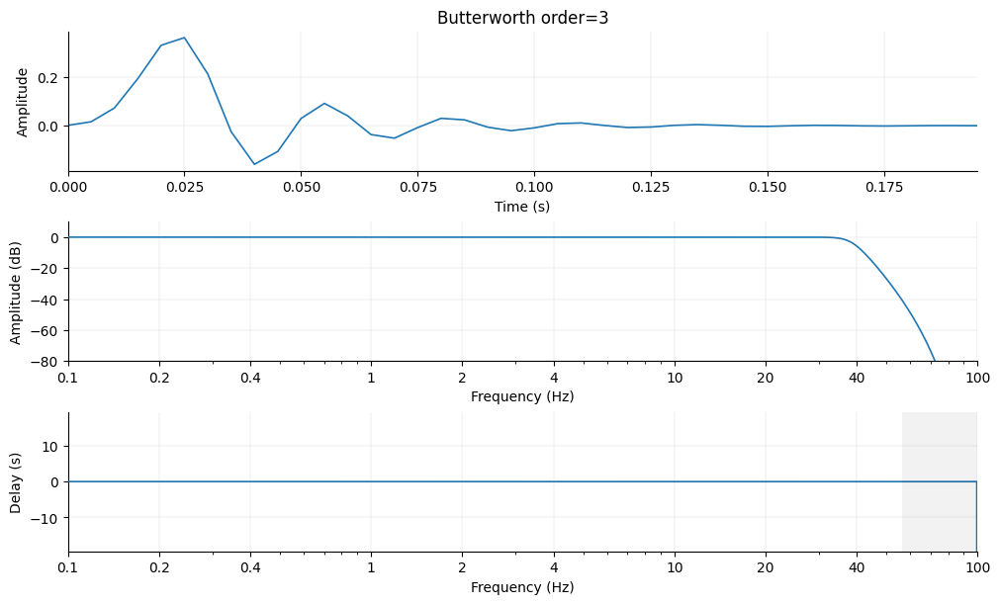

In [ ]:
mne.viz.plot_filter(filt, raw.info["sfreq"], title = "Butterworth order=3");

In [ ]:
raw_filtered_bw = raw.copy().filter(l_freq=None,h_freq=38,method='iir', iir_params=iir_params)

Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 38 Hz

IIR filter parameters
---------------------
Butterworth lowpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 16 (effective, after forward-backward)
- Cutoff at 38.00 Hz: -6.02 dB



In [ ]:
def get_start_points(length,n_windows,beginning,end,sfreq):
  start_points = []

  last_point = end * sfreq - length

  interval = (last_point-beginning*sfreq) / (n_windows-1)

  for i in range(n_windows):
    start_points.append(int(beginning*sfreq + i*interval))

  return start_points

In [ ]:
def window_slice(signals,codes,events_codes,window_start_points,segment_length, window = False):

  data = signals.copy().get_data()

  subj_marker = list()
  subj_data = list()

  for i, code in enumerate(codes):
    if code in int_marker and codes[i-1]==0:
      if window:
        for p in window_start_points:
          subj_data.append(data[:,i+p:i+p+segment_length].T)
          subj_marker.append(code)
      else:
        subj_data.append(data[:,i:i+segment_length].T)
        subj_marker.append(code)

  return subj_marker, subj_data

In [ ]:
sm,sd = window_slice(raw_filtered_bw,subject['o'][0][0][4].reshape(1,-1)[0],int_marker,get_start_points(200,3,-0.5,1,200),200)

In [ ]:
folder_path = '/content/drive/MyDrive/eeg_data'
int_marker = [1,2,3,4,5,6]
events_to_annotations = {
    1: "Left hand",
    2: "Right hand",
    3: "Passive/neutral",
    4: "Left leg",
    5: "Tongue",
    6: "Right leg"
}

columns = ['subject','marker','data']
df = pd.DataFrame(columns = columns)

segment_length = 210
n_windows = 3
beginning = 0 # seconds before trial starts
end = 1.05 # seconds after trial starts

start_points_windows = get_start_points(segment_length,n_windows,beginning,end,sfreq)

for filename in os.listdir(folder_path):
    if os.path.isfile(os.path.join(folder_path,filename)):

      mat = scipy.io.loadmat(folder_path + '/' + filename)

      raw = mne.io.RawArray(mat['o'][0][0][5].T, info)
      raw_filtered = raw.filter(l_freq=None,h_freq=38,method='iir', iir_params=iir_params, verbose = 0, phase = 'forward')

      codes = mat['o'][0][0][4].reshape(1,-1)[0]

      subj_marker, subj_data = window_slice(raw_filtered,
                                            codes,
                                            int_marker,
                                            start_points_windows,
                                            segment_length,
                                            window = False)

      pattern = r'Subject[A-Za-z]'
      matches = re.findall(pattern, filename)
      subject = matches[0][-1]
      subj_lst = [subject]* len(subj_marker)

      subj_df = pd.DataFrame({
                "subject" : subj_lst,
                "marker": subj_marker,
                "data": subj_data
            })
      df = pd.concat([df, subj_df], ignore_index=True)

Creating RawArray with float64 data, n_channels=22, n_times=665400
    Range : 0 ... 665399 =      0.000 ...  3326.995 secs
Ready.
Creating RawArray with float64 data, n_channels=22, n_times=709800
    Range : 0 ... 709799 =      0.000 ...  3548.995 secs
Ready.
Creating RawArray with float64 data, n_channels=22, n_times=672400
    Range : 0 ... 672399 =      0.000 ...  3361.995 secs
Ready.
Creating RawArray with float64 data, n_channels=22, n_times=666000
    Range : 0 ... 665999 =      0.000 ...  3329.995 secs
Ready.
Creating RawArray with float64 data, n_channels=22, n_times=678600
    Range : 0 ... 678599 =      0.000 ...  3392.995 secs
Ready.
Creating RawArray with float64 data, n_channels=22, n_times=671200
    Range : 0 ... 671199 =      0.000 ...  3355.995 secs
Ready.
Creating RawArray with float64 data, n_channels=22, n_times=677600
    Range : 0 ... 677599 =      0.000 ...  3387.995 secs
Ready.
Creating RawArray with float64 data, n_channels=22, n_times=667400
    Range : 0 ..

# Upload dataset to Drive

In [ ]:
df.to_pickle("/content/drive/MyDrive/dataset_filter.pkl")

# EDA of interesting cases after modeling

In [ ]:
event_dict = {
    1: "Left hand",
    2: "Right hand",
    3: "Passive/neutral",
    4: "Left leg",
    5: "Tongue",
    6: "Right leg"
}

In [ ]:
event_op = {k:v for (v,k) in event_dict.items()}

## Subject 'H'

In [ ]:
subjectH = scipy.io.loadmat('/content/drive/eeg_data/HaLT-SubjectH-160720-6St-LRHandLegTongue.mat')

In [ ]:
channels = [ch[0] for ch in subjectH['o'][0][0][6][:,0]]

In [ ]:
int_marker = [1,2,3,4,5,6]
marker_array = subjectH['o'][0][0][4].reshape(1,-1)[0]
eventsH = []
for i,m in enumerate(marker_array):
  if m in int_marker and marker_array[i-1]==0:
    eventsH.append([i,0,m])

In [ ]:
eventsH = np.array(eventsH)

In [ ]:
# samp Frequency
sfreq = subjectH['o'][0][0][2][0]

In [ ]:
matH = subjectH['o'][0][0][5]

In [ ]:
info = mne.create_info(ch_names = channels,ch_types=['eeg']*21 + ['stim'],sfreq = sfreq)

In [ ]:
rawH = mne.io.RawArray(matH.T, info)

Creating RawArray with float64 data, n_channels=22, n_times=664400
    Range : 0 ... 664399 =      0.000 ...  3321.995 secs
Ready.


In [ ]:
rawH.add_events(eventsH,stim_channel = 'X5',replace=True)

In [ ]:
event_dict

{1: 'Left hand',
 2: 'Right hand',
 3: 'Passive/neutral',
 4: 'Left leg',
 5: 'Tongue',
 6: 'Right leg'}

In [ ]:
eventsH

array([[ 33554,      0,      1],
       [ 34242,      0,      4],
       [ 34768,      0,      2],
       ...,
       [660212,      0,      5],
       [660749,      0,      3],
       [661378,      0,      6]])

In [ ]:
annotationsH = mne.annotations_from_events(events=eventsH, sfreq=sfreq, event_desc=event_dict)

In [ ]:
annotationsH.set_durations(1)

<Annotations | 955 segments: Left hand (163), Left leg (155), ...>

In [ ]:
rawH.set_annotations(annotationsH)

Measurement date,Unknown
Experimenter,Unknown
Participant,Unknown
Digitized points,Not available
Good channels,"21 EEG, 1 Stimulus"
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,200.00 Hz
Highpass,0.00 Hz
Lowpass,100.00 Hz


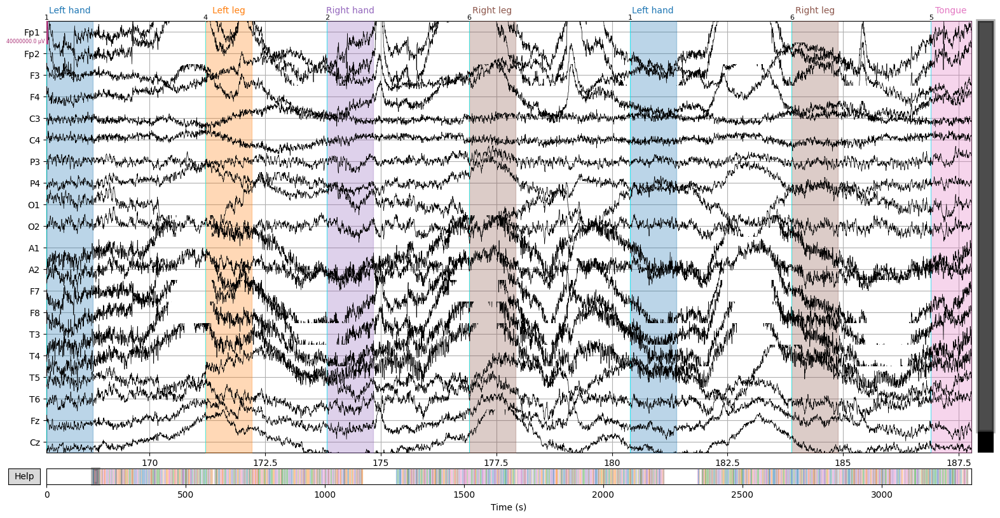

In [ ]:
rawH.plot(events = eventsH,picks='data',duration =  20, start = 33554/200, scalings=20,group_by='type');

In [ ]:
eventsH[:10]

array([[33554,     0,     1],
       [34242,     0,     4],
       [34768,     0,     2],
       [35382,     0,     6],
       [36078,     0,     1],
       [36778,     0,     6],
       [37380,     0,     5],
       [37913,     0,     3],
       [38600,     0,     5],
       [39295,     0,     4]])

## Subject 'I'

In [ ]:
subjectI = scipy.io.loadmat('/content/drive/MyDrive/eeg_data/HaLT-SubjectI-160609-6St-LRHandLegTongue.mat')

In [ ]:
int_marker = [1,2,3,4,5,6]
marker_array = subjectI['o'][0][0][4].reshape(1,-1)[0]
eventsI = []
for i,m in enumerate(marker_array):
  if m in int_marker and marker_array[i-1]==0:
    eventsI.append([i,0,m])

In [ ]:
eventsI = np.array(eventsI)

In [ ]:
matI = subjectI['o'][0][0][5]

In [ ]:
rawI = mne.io.RawArray(matI.T, info)

Creating RawArray with float64 data, n_channels=22, n_times=664400
    Range : 0 ... 664399 =      0.000 ...  3321.995 secs
Ready.


In [ ]:
rawI.add_events(eventsI,stim_channel = 'X5',replace=True)

In [ ]:
annotationsI = mne.annotations_from_events(events=eventsI, sfreq=sfreq, event_desc=event_dict)

In [ ]:
annotationsI.set_durations(1)

<Annotations | 885 segments: Left hand (145), Left leg (147), ...>

In [ ]:
rawI.set_annotations(annotationsI)

Measurement date,Unknown
Experimenter,Unknown
Participant,Unknown
Digitized points,Not available
Good channels,"21 EEG, 1 Stimulus"
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,200.00 Hz
Highpass,0.00 Hz
Lowpass,100.00 Hz


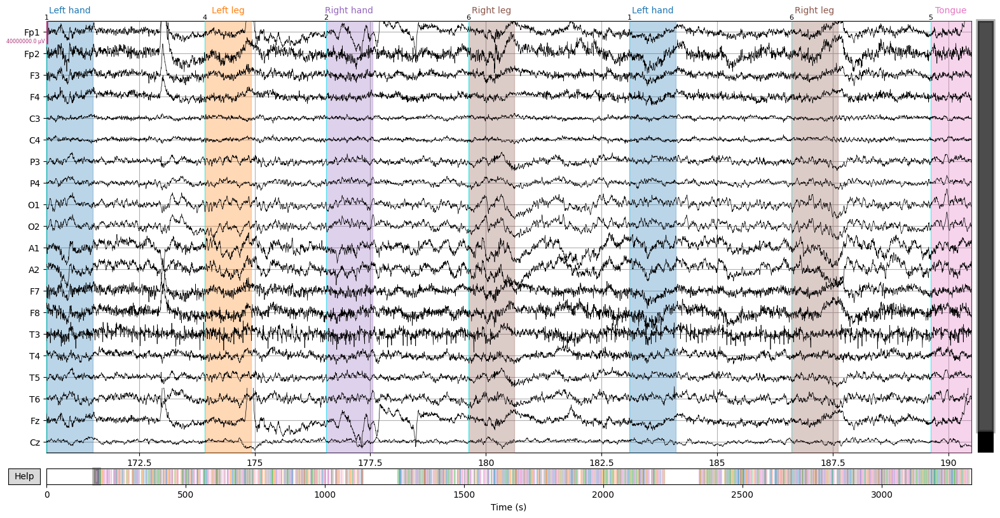

In [ ]:
rawI.plot(events = eventsI,picks='data',duration =  20, start = 34099/200, scalings=20,group_by='type');

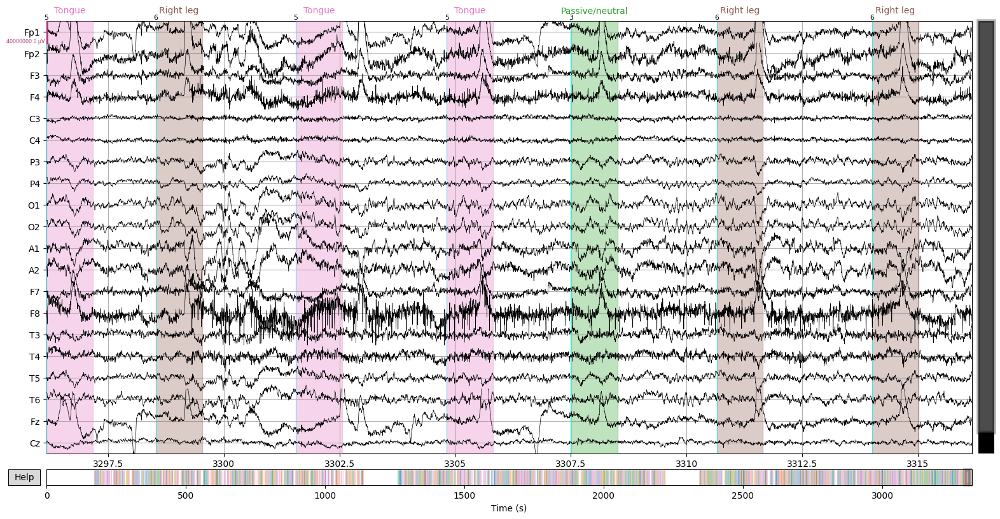

In [ ]:
rawI.plot(events = eventsI,picks='data',duration =  20, start = 659233/200, scalings=20,group_by='type');

In [ ]:
eventsI[:10]

array([[34099,     0,     1],
       [34785,     0,     4],
       [35309,     0,     2],
       [35924,     0,     6],
       [36621,     0,     1],
       [37322,     0,     6],
       [37924,     0,     5],
       [38428,     0,     3],
       [39168,     0,     5],
       [39805,     0,     4]])

In [ ]:
eventsI[-7:]

array([[659233,      0,      5],
       [659706,      0,      6],
       [660311,      0,      5],
       [660964,      0,      5],
       [661502,      0,      3],
       [662130,      0,      6],
       [662802,      0,      6]])

## Subject 'L'

In [ ]:
subjectL = scipy.io.loadmat('/content/drive/MyDrive/eeg_data/HaLT-SubjectL-161116-6St-LRHandLegTongue.mat')

In [ ]:
int_marker = [1,2,3,4,5,6]
marker_array = subjectH['o'][0][0][4].reshape(1,-1)[0]
eventsL = []
for i,m in enumerate(marker_array):
  if m in int_marker and marker_array[i-1]==0:
    eventsL.append([i,0,m])

In [ ]:
eventsL = np.array(eventsL)

In [ ]:
matL = subjectL['o'][0][0][5]

In [ ]:
rawL = mne.io.RawArray(matL.T, info)

Creating RawArray with float64 data, n_channels=22, n_times=672400
    Range : 0 ... 672399 =      0.000 ...  3361.995 secs
Ready.


In [ ]:
rawL.add_events(eventsL,stim_channel = 'X5',replace=True)

In [ ]:
eventsL

array([[ 33554,      0,      1],
       [ 34242,      0,      4],
       [ 34768,      0,      2],
       ...,
       [660212,      0,      5],
       [660749,      0,      3],
       [661378,      0,      6]])

In [ ]:
annotationsL = mne.annotations_from_events(events=eventsL, sfreq=sfreq, event_desc=event_dict)

In [ ]:
annotationsL.set_durations(1)

<Annotations | 955 segments: Left hand (163), Left leg (155), ...>

In [ ]:
rawL.set_annotations(annotationsL)

Measurement date,Unknown
Experimenter,Unknown
Participant,Unknown
Digitized points,Not available
Good channels,"21 EEG, 1 Stimulus"
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,200.00 Hz
Highpass,0.00 Hz
Lowpass,100.00 Hz


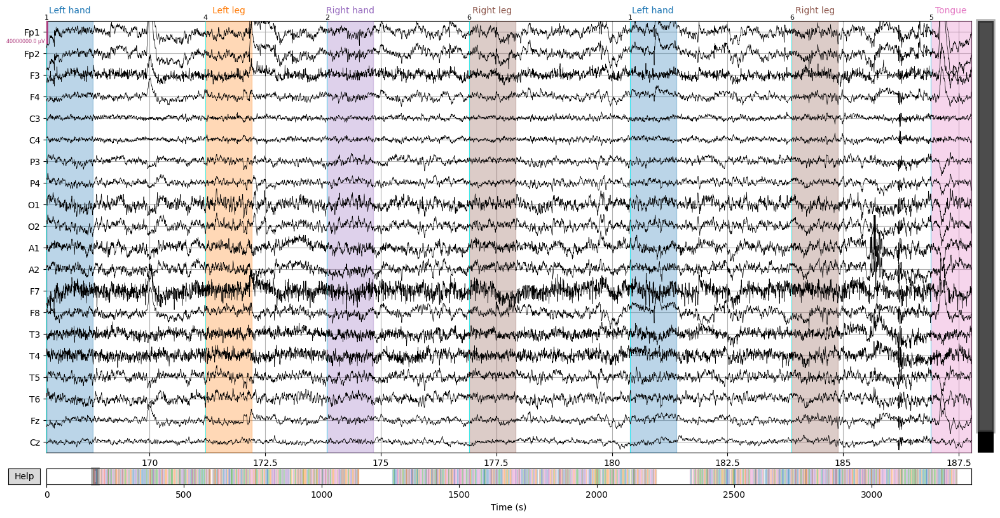

In [ ]:
rawL.plot(events = eventsL,picks='data',duration =  20, start = 33554/200, scalings=20,group_by='type');

In [ ]:
eventsL

array([[ 33554,      0,      1],
       [ 34242,      0,      4],
       [ 34768,      0,      2],
       ...,
       [660212,      0,      5],
       [660749,      0,      3],
       [661378,      0,      6]])

## Filter

In [ ]:
iir_params = dict(order=3, ftype="butter",phase='forward')
filt = mne.filter.create_filter(
    raw.get_data(), sfreq, l_freq=None, h_freq=38, method="iir", iir_params=iir_params, verbose=True, phase= 'forward')

Setting up low-pass filter at 38 Hz

IIR filter parameters
---------------------
Butterworth lowpass non-linear phase (one-pass forward) causal filter:
- Filter order 3 (forward)
- Cutoff at 38.00 Hz: -3.01 dB



In [ ]:
filt2 = mne.filter.create_filter(
    raw.get_data(), sfreq, l_freq=4, h_freq=38, method="iir", iir_params=iir_params, verbose=True, phase= 'forward')

Setting up band-pass filter from 4 - 38 Hz

IIR filter parameters
---------------------
Butterworth bandpass non-linear phase (one-pass forward) causal filter:
- Filter order 6 (forward)
- Cutoffs at 4.00, 38.00 Hz: -3.01, -3.01 dB



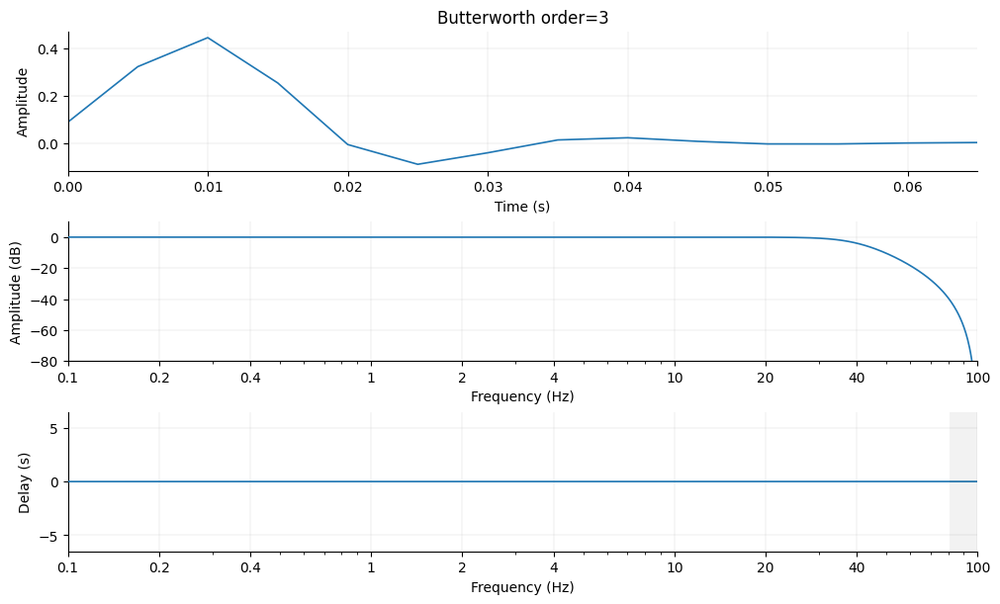

In [ ]:
mne.viz.plot_filter(filt, raw.info["sfreq"], title = "Butterworth order=3");

In [ ]:
rawH_filtered = rawH.copy().filter(l_freq=None,h_freq=38,method='iir', iir_params=iir_params)

Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 38 Hz

IIR filter parameters
---------------------
Butterworth lowpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 6 (effective, after forward-backward)
- Cutoff at 38.00 Hz: -6.02 dB



In [ ]:
from mpl_toolkits.axes_grid1 import ImageGrid

In [ ]:
rawH_filtered

Measurement date,Unknown
Experimenter,Unknown
Participant,Unknown
Digitized points,Not available
Good channels,"21 EEG, 1 Stimulus"
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,200.00 Hz
Highpass,0.00 Hz
Lowpass,38.00 Hz


In [ ]:
rawH_filtered.set_annotations(annotationsH)

Measurement date,Unknown
Experimenter,Unknown
Participant,Unknown
Digitized points,Not available
Good channels,"21 EEG, 1 Stimulus"
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,200.00 Hz
Highpass,0.00 Hz
Lowpass,38.00 Hz


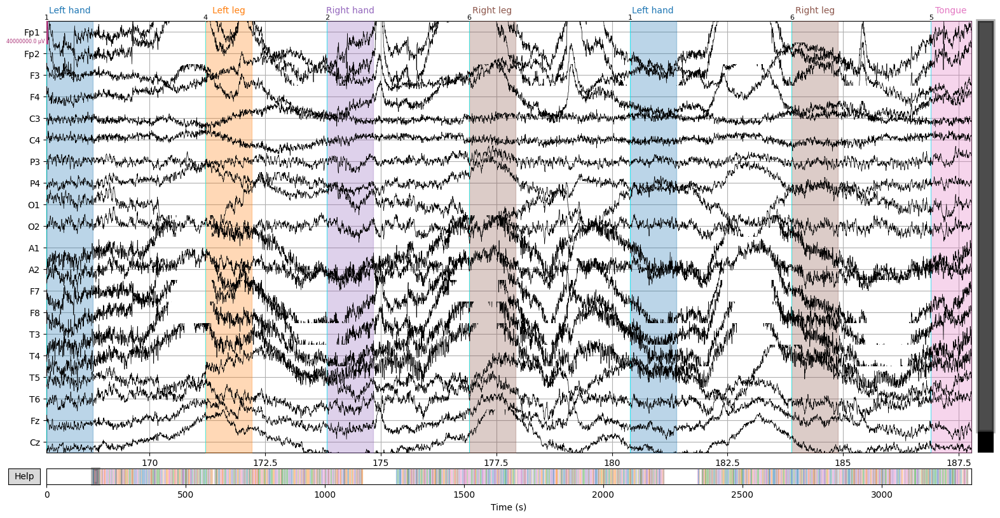

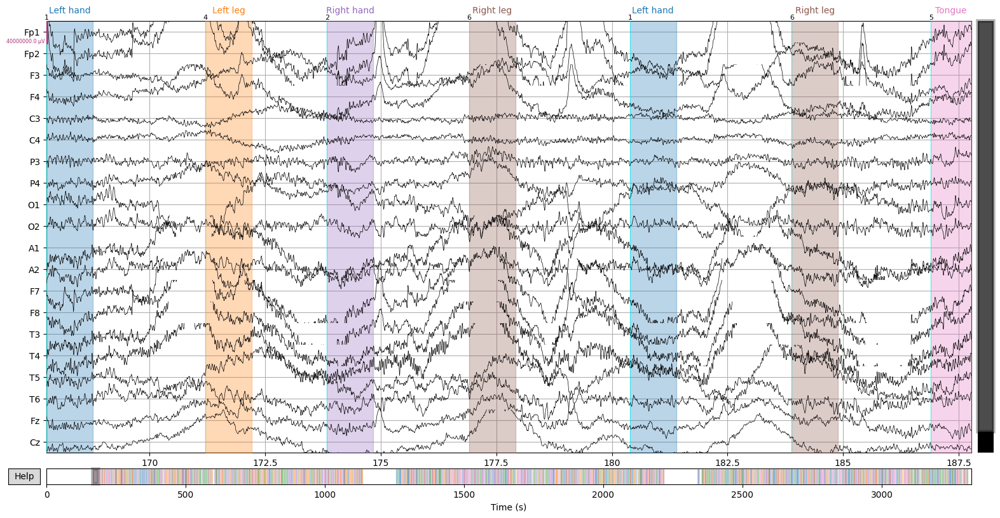

In [ ]:
raw_plot = rawH.plot(events = eventsH,picks='data',duration =  20, start = 33554/200, scalings=20,group_by='type');
filtered_plot = rawH_filtered.plot(events = eventsH,picks='data',duration =  20, start = 33554/200, scalings=20,group_by='type');

In [ ]:
rawL_filtered = rawL.copy().filter(l_freq=None,h_freq=38,method='iir', iir_params=iir_params)

Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 38 Hz

IIR filter parameters
---------------------
Butterworth lowpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 6 (effective, after forward-backward)
- Cutoff at 38.00 Hz: -6.02 dB



In [ ]:
rawL_filtered.set_annotations(annotationsL)

Measurement date,Unknown
Experimenter,Unknown
Participant,Unknown
Digitized points,Not available
Good channels,"21 EEG, 1 Stimulus"
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,200.00 Hz
Highpass,0.00 Hz
Lowpass,38.00 Hz


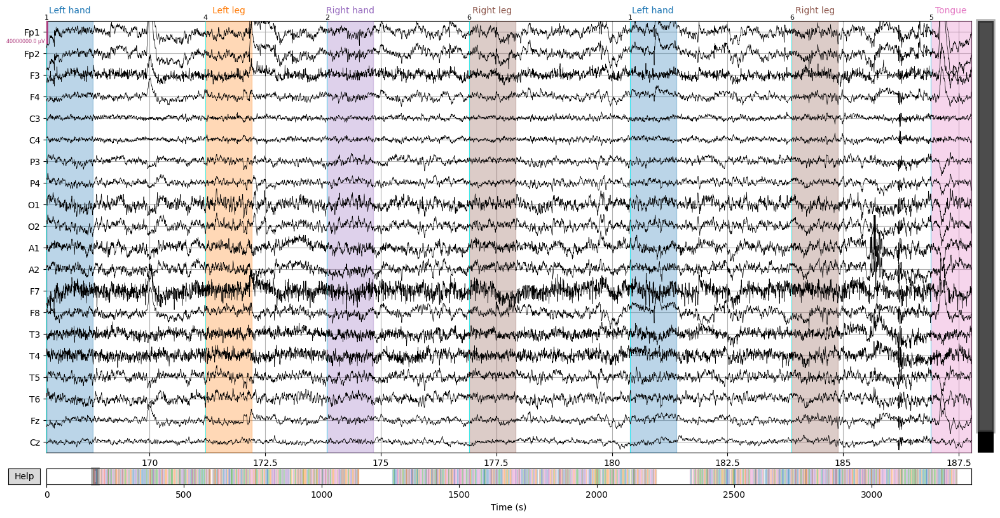

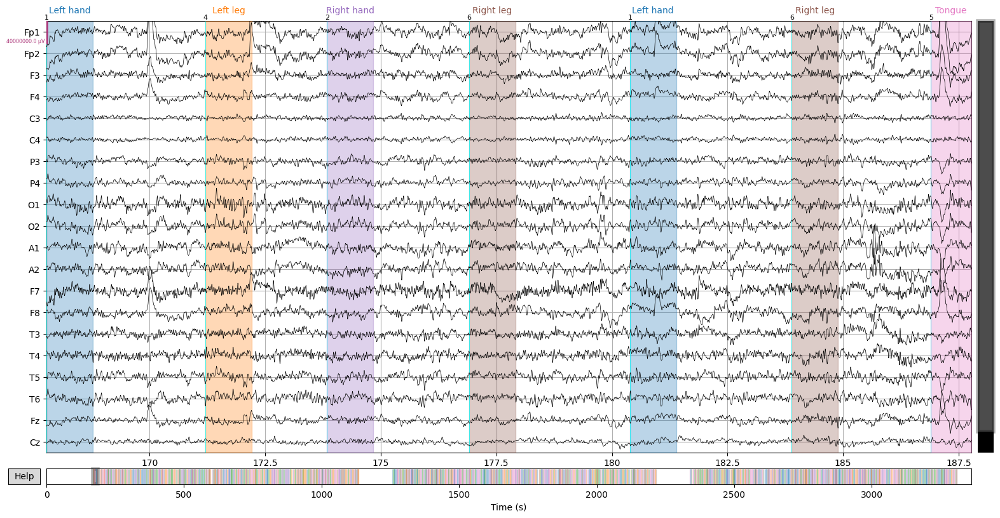

In [ ]:
raw_plot = rawL.plot(events = eventsL,picks='data',duration =  20, start = 33554/200, scalings=20,group_by='type');
filtered_plot = rawL_filtered.plot(events = eventsL,picks='data',duration =  20, start = 33554/200, scalings=20,group_by='type');

In [ ]:
mpl.rcParams['figure.figsize'] = (3, 2)

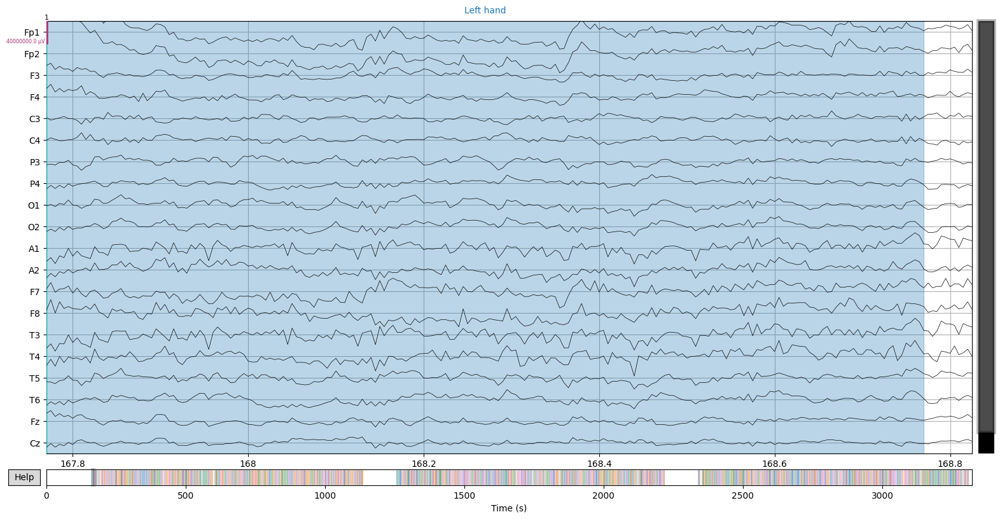

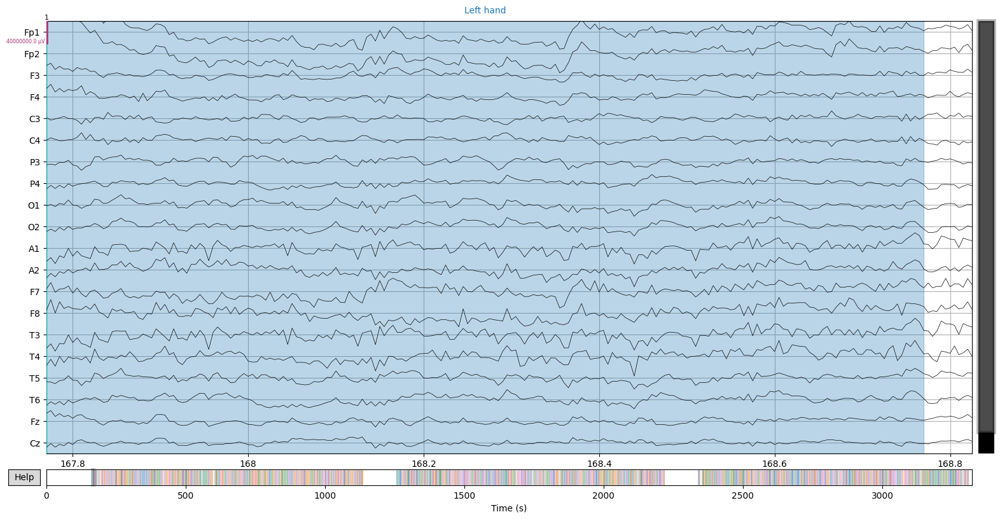

In [ ]:
rawH.plot(events = eventsH,picks='data',duration =  1.05, start = 33554/200, scalings=20,group_by='type');

In [ ]:
eventsH[:10]

array([[33554,     0,     1],
       [34242,     0,     4],
       [34768,     0,     2],
       [35382,     0,     6],
       [36078,     0,     1],
       [36778,     0,     6],
       [37380,     0,     5],
       [37913,     0,     3],
       [38600,     0,     5],
       [39295,     0,     4]])

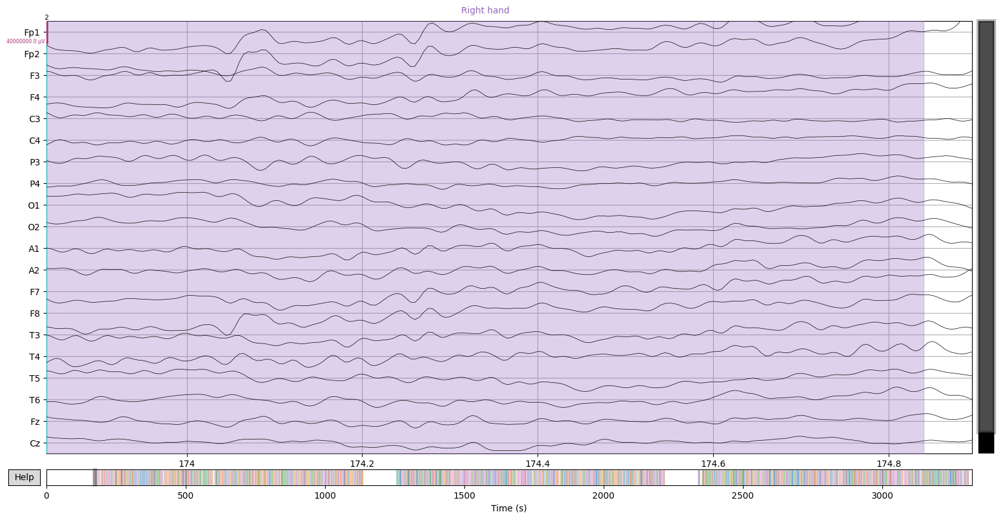

In [ ]:
rawH_filtered.plot(events = eventsH,picks='data',duration =  1.05, start = 34768/200, scalings=20,group_by='type');

## PSD

In [ ]:
s_1020_montage = mne.channels.make_standard_montage("standard_1020")

In [ ]:
rawH_filtered.set_montage(s_1020_montage)
rawL_filtered.set_montage(s_1020_montage)

Measurement date,Unknown
Experimenter,Unknown
Participant,Unknown
Digitized points,24 points
Good channels,"21 EEG, 1 Stimulus"
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,200.00 Hz
Highpass,0.00 Hz
Lowpass,38.00 Hz


In [ ]:
rawH_filtered2 = rawH.copy().filter(l_freq=4,h_freq=38,method='iir', iir_params=iir_params)
rawH_filtered2.set_montage(s_1020_montage)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 4 - 38 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 12 (effective, after forward-backward)
- Cutoffs at 4.00, 38.00 Hz: -6.02, -6.02 dB



Measurement date,Unknown
Experimenter,Unknown
Participant,Unknown
Digitized points,24 points
Good channels,"21 EEG, 1 Stimulus"
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,200.00 Hz
Highpass,4.00 Hz
Lowpass,38.00 Hz


Effective window size : 10.240 (s)
Plotting power spectral density (dB=True).


<ipython-input-258-1cf07d19b7b3>:1: FutureWarning: The value of `amplitude='auto'` will be removed in MNE 1.8.0, and the new default will be `amplitude=False`.
  rawH.compute_psd(fmax=60, picks='data').plot();
<ipython-input-258-1cf07d19b7b3>:1: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  rawH.compute_psd(fmax=60, picks='data').plot();


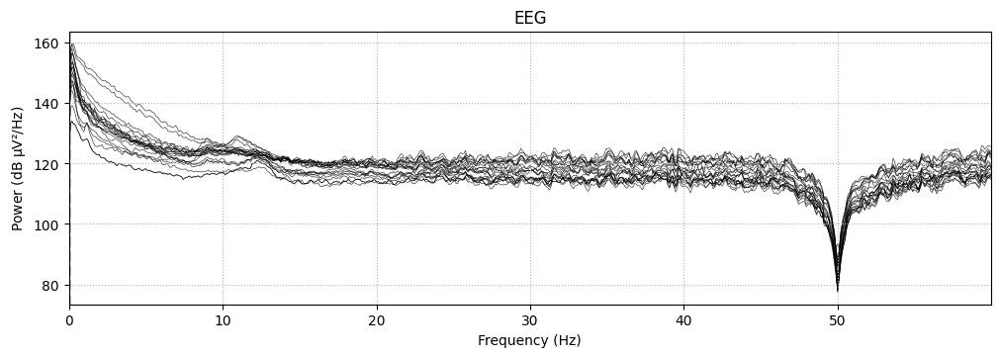

In [ ]:
rawH.compute_psd(fmax=60, picks='data').plot();

Effective window size : 10.240 (s)
Plotting power spectral density (dB=True).


<ipython-input-257-b51899b08e00>:1: FutureWarning: The value of `amplitude='auto'` will be removed in MNE 1.8.0, and the new default will be `amplitude=False`.
  rawH_filtered2.compute_psd(fmax=60, picks='data').plot();


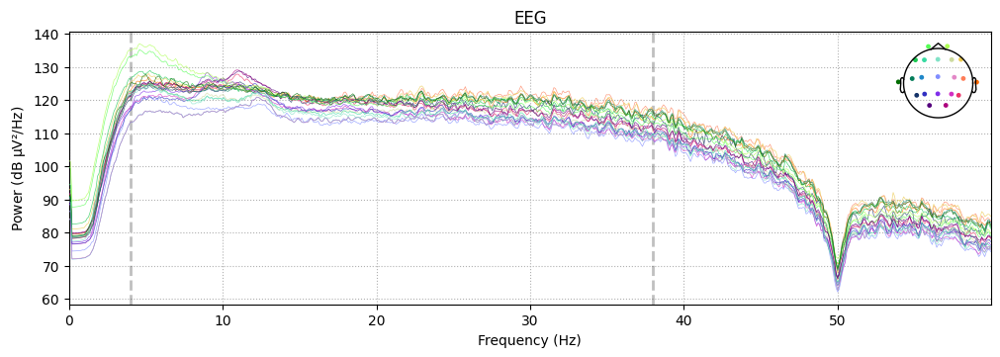

In [ ]:
rawH_filtered2.compute_psd(fmax=60, picks='data').plot();

Effective window size : 10.240 (s)
Plotting power spectral density (dB=True).


<ipython-input-256-d8ad515e9bd9>:1: FutureWarning: The value of `amplitude='auto'` will be removed in MNE 1.8.0, and the new default will be `amplitude=False`.
  rawH_filtered.compute_psd(fmax=60, picks='data').plot();


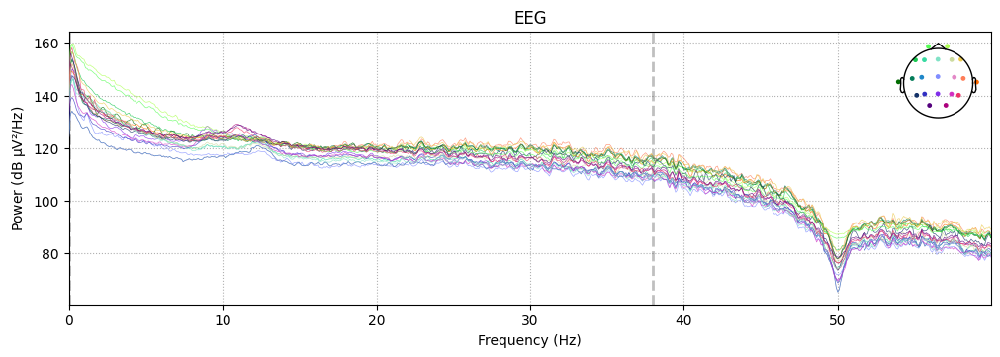

In [ ]:
rawH_filtered.compute_psd(fmax=60, picks='data').plot();

Effective window size : 10.240 (s)
Plotting power spectral density (dB=True).


<ipython-input-240-4776793ce734>:1: FutureWarning: The value of `amplitude='auto'` will be removed in MNE 1.8.0, and the new default will be `amplitude=False`.
  rawL_filtered.compute_psd(fmax=38, picks='data').plot();


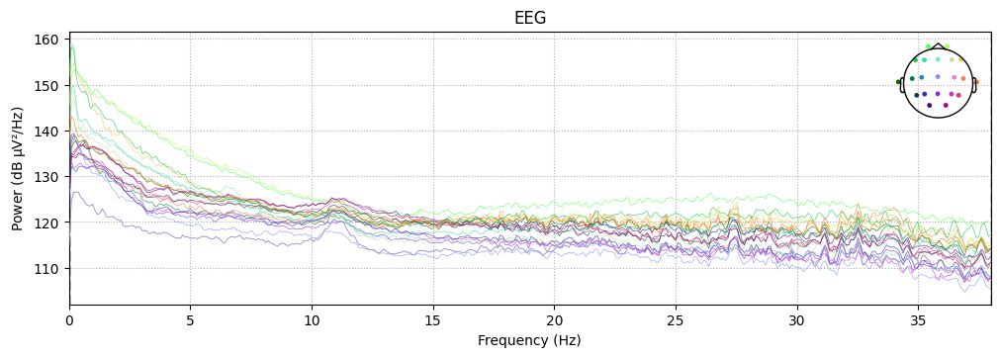

In [ ]:
rawL_filtered.compute_psd(fmax=38, picks='data').plot();

In [ ]:
a= rawH_filtered.compute_psd(fmax=38, picks='data')

Effective window size : 10.240 (s)
